<a href="https://colab.research.google.com/github/Didacum82/Mapas/blob/main/Albergues.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Mapa de Galicia que mostra as provincias, cos distintos camiños que van a Santiago e no que represento a rede de albergues agrupada por clústers

In [12]:
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import folium
import folium.plugins
import requests

In [13]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Cargo o archivo de concellos de Galicia para crear o mapa de Galicia. O archivo pode descargarse da páxina do sergas

In [14]:
df_concello = gpd.read_file('/content/drive/MyDrive/Datasets/Concellos/Concellos_IGN.shp')
df_concello.head()




,NomeConcel,CodCONC,Concello,CodCOM,CodPROV,NomeCapita,Comarca,Provincia,CODIGOINE,NomeMAY,Shape_Leng,Shape_Area,VALOR,geometry
0,Sarreaus,32078.0,Sarreaus,32.0,32.0,Sarreaus,A Limia,Ourense,32078,SARREAUS,40754.205361,7.725592e+07,NaN,"POLYGON ((608813.195 4664453.146, 608701.934 4..."
1,Taboadela,32079.0,Taboadela,37.0,32.0,Taboadela,Ourense,Ourense,32079,TABOADELA,23378.040256,2.517205e+07,NaN,"POLYGON ((593815.346 4676211.812, 593751.767 4..."
2,A Bola,32014.0,"Bola, A",39.0,32.0,"Bola, A",Terra De Celanova,Ourense,32014,A BOLA,25533.370597,3.488287e+07,NaN,"POLYGON ((588198.821 4663569.77, 588204.697 46..."
3,Maside,32045.0,Maside,35.0,32.0,Maside,O Carballiño,Ourense,32045,MASIDE,27891.138676,4.001874e+07,NaN,"POLYGON ((577375.148 4694642.899, 577328.854 4..."
4,Trasmiras,32082.0,Trasmiras,32.0,32.0,Trasmiras,A Limia,Ourense,32082,TRASMIRAS,38334.093117,5.670926e+07,NaN,"POLYGON ((613123.723 4648827.622, 613103.413 4..."


EPSG:25829


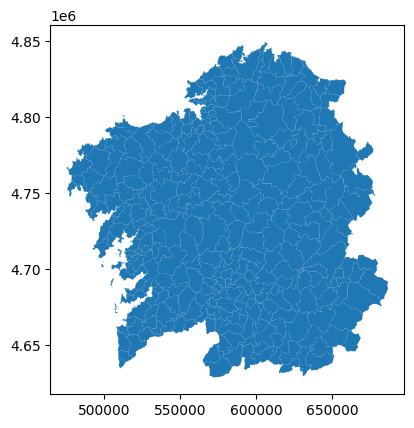

In [15]:
df_concello.plot()
print(df_concello.crs)

## Cargo os datos dos camiños de Santiago obtidos na páxina do sergas, camiño frances, inglés e norte, o archivo dos camiños portugués, vía da prata e fisterra obtívenos noutra web, polo que comprobo o seu crs

In [18]:
df_camiño_ingles = gpd.read_file('/content/drive/MyDrive/camiño/camiño/Camino_santiago/Camiño_Ingles/25829/SHP/AMBITO.shp')
color = 'black'
df_camiño_ingles['color'] = color
df_camiño_ingles



,AMBITO,Shape_Area,geometry,color
0,AMBITO CAMIÑO INGLÉS,4.779299e+07,"POLYGON ((548992.072 4798920.976, 548989.338 4...",black
1,AMBITO CAMIÑO INGLÉS,1.259252e+07,"POLYGON ((564249.474 4792279.832, 564248.284 4...",black


EPSG:25829


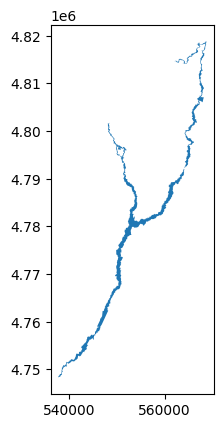

In [19]:
df_camiño_ingles.plot()
print(df_camiño_ingles.crs)

In [23]:
df_camiño_nortecosta = gpd.read_file('/content/drive/MyDrive/camiño/camiño/Camino_santiago/Camiño_Norte_Costa/25829/SHP/Territorio_Historico.shp')
color = 'red'
df_camiño_nortecosta['color'] = color
df_camiño_nortecosta



,NUMERODUP,geometry,color
0,None,"MULTIPOLYGON (((616961.951 4798021.522, 616965...",red
1,None,"POLYGON ((568745.188 4758687.279, 568744.368 4...",red
2,None,"POLYGON ((568710.118 4758683.059, 568710.838 4...",red
3,None,"POLYGON ((570401.649 4760921.549, 570401.559 4...",red
4,None,"POLYGON ((658552.296 4822900.152, 658529.351 4...",red


EPSG:25829


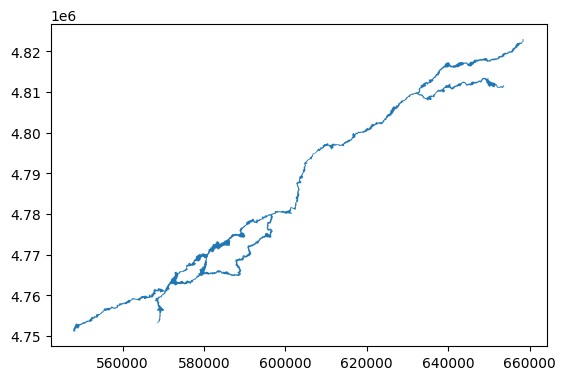

In [24]:
df_camiño_nortecosta.plot()
print(df_camiño_nortecosta.crs)

In [28]:
df_camiño_norteinterior = gpd.read_file('/content/drive/MyDrive/camiño//camiño/Camino_santiago/Camiño_Norte_Interior/25829/SHP/Territorio_Historico.shp')
color = 'yellow'
df_camiño_norteinterior['color'] = color
df_camiño_norteinterior

,Disolve,geometry,color
0,0,"POLYGON ((584979.029 4755200.617, 584973.818 4...",yellow


EPSG:25829


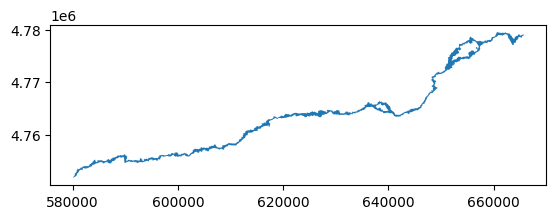

In [29]:
df_camiño_norteinterior.plot()
print(df_camiño_norteinterior.crs)

In [31]:
df_camiño_fisterra = gpd.read_file('/content/drive/MyDrive/camiño/camiño/CAMIÑO DE FISTERRA/001_FISTERRA_TRAZADO.shp')
df_camiño_fisterra = df_camiño_fisterra.to_crs('EPSG:25829')
color = 'yellow'
df_camiño_fisterra['color'] = color
df_camiño_fisterra

,Trazado,geometry,color
0,CAMINO FISTERRA,"POLYGON ((530772.44 4747782.799, 530774.76 474...",yellow


EPSG:25829


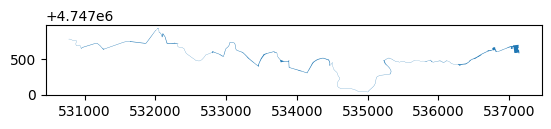

In [32]:
df_camiño_fisterra.plot()
print(df_camiño_fisterra.crs)

In [35]:
df_camiño_frances = gpd.read_file('/content/drive/MyDrive/camiño/camiño/Camino_santiago/Camiño_Frances/25829/SHP/AMBITO_BIC.shp')
color = 'orange'
df_camiño_frances['color'] = color
df_camiño_frances

,NOME,SUPERFICIE,geometry,color
0,AMBITO DA DELIMITACIÓN DO BIC CAMIÑO FRANCES,1.020873e+08,"POLYGON ((661304.897 4730285.476, 661293.964 4...",orange


EPSG:25829


,NOME,SUPERFICIE,geometry,color
0,AMBITO DA DELIMITACIÓN DO BIC CAMIÑO FRANCES,1.020873e+08,"POLYGON ((661304.897 4730285.476, 661293.964 4...",orange


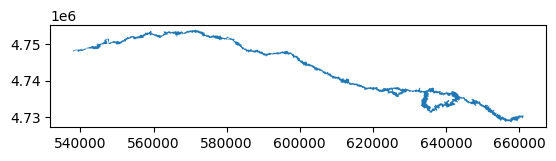

In [36]:

df_camiño_frances.plot()
print(df_camiño_frances.crs)
df_camiño_frances


In [38]:
df_camiño_portugues = gpd.read_file('/content/drive/MyDrive/camiño/camiño/CAMIÑO PORTUGUÉS/TRAZADOS/003_PORTUGUES_TRAZADO.shp')
df_camiño_portugues = df_camiño_portugues.to_crs('EPSG:25829')
color = 'blue'
df_camiño_portugues ['color'] = color
df_camiño_portugues


,Trazado,geometry,color
0,CAMINO PORTUGUES,"POLYGON ((537240.212 4747757.071, 537241.212 4...",blue


EPSG:25829


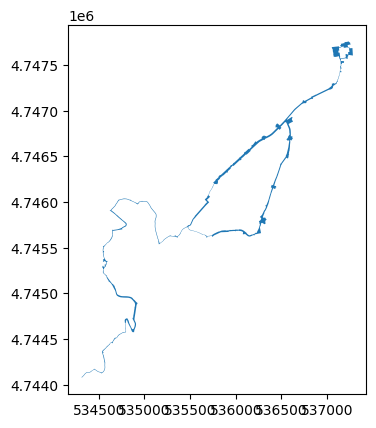

In [39]:
df_camiño_portugues.plot()
print(df_camiño_portugues.crs)

In [41]:
df_camiño_prata = gpd.read_file('/content/drive/MyDrive/camiño/camiño/RUTA DA PRATA/TRAZADOS/004_VIAPRATA_TRAZADO.shp')
df_camiño_prata = df_camiño_prata.to_crs('EPSG:25829')

color = 'purple'
df_camiño_prata['color'] = color
df_camiño_prata

,Trazado,geometry,color
0,RUTA DA PRATA,"POLYGON ((537240.212 4747757.071, 537241.212 4...",purple


EPSG:25829


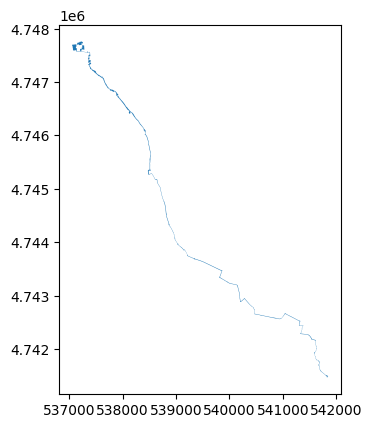

In [42]:
df_camiño_prata.plot()
print(df_camiño_prata.crs)


## Como non puiden mostrar todolos camiños, seguín coa búsqueda e atopei outro arquivo ca información de tódolos camiños

In [43]:
df_todos = gpd.read_file('/content/drive/MyDrive/camiño/camiño/Camino_de_Santiago.shp')
df_todos = df_todos.to_crs('EPSG:25829')

color = 'green'
df_todos['color'] = color
df_todos

,geometry,color
0,"LINESTRING (529748.305 4655076.606, 529568.255...",green
1,"LINESTRING (493032.363 4759287.476, 493031.044...",green
2,"LINESTRING (478346.574 4751260.961, 478172.995...",green
3,"LINESTRING (668467.876 4655523.667, 668451.98 ...",green
4,"MULTILINESTRING ((580308.97 4751761.961, 58030...",green
5,"MULTILINESTRING ((659592.436 4729998.766, 6595...",green
6,"LINESTRING (553018.72 4780109.606, 553018.89 4...",green
7,"LINESTRING (537132.715 4747697.564, 537156.326...",green
8,"MULTILINESTRING ((554023.461 4755143.303, 5540...",green
9,"LINESTRING (654110.612 4658210.069, 653980.57 ...",green


EPSG:25829


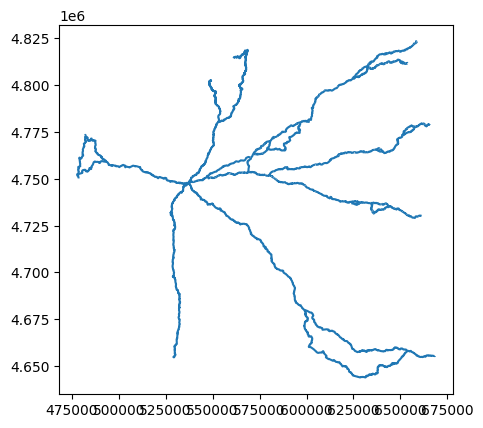

In [44]:
df_todos.plot()
print(df_todos.crs)

## mostro o mapa de Galicia cos concellos e os distintos camiños, o camiño portugués, vía da prata e fisterra non aparecen na mesma unidade de medida no mapa e non sei o motivo, xa que os calores e o CRS é o mesmo

<Axes: >

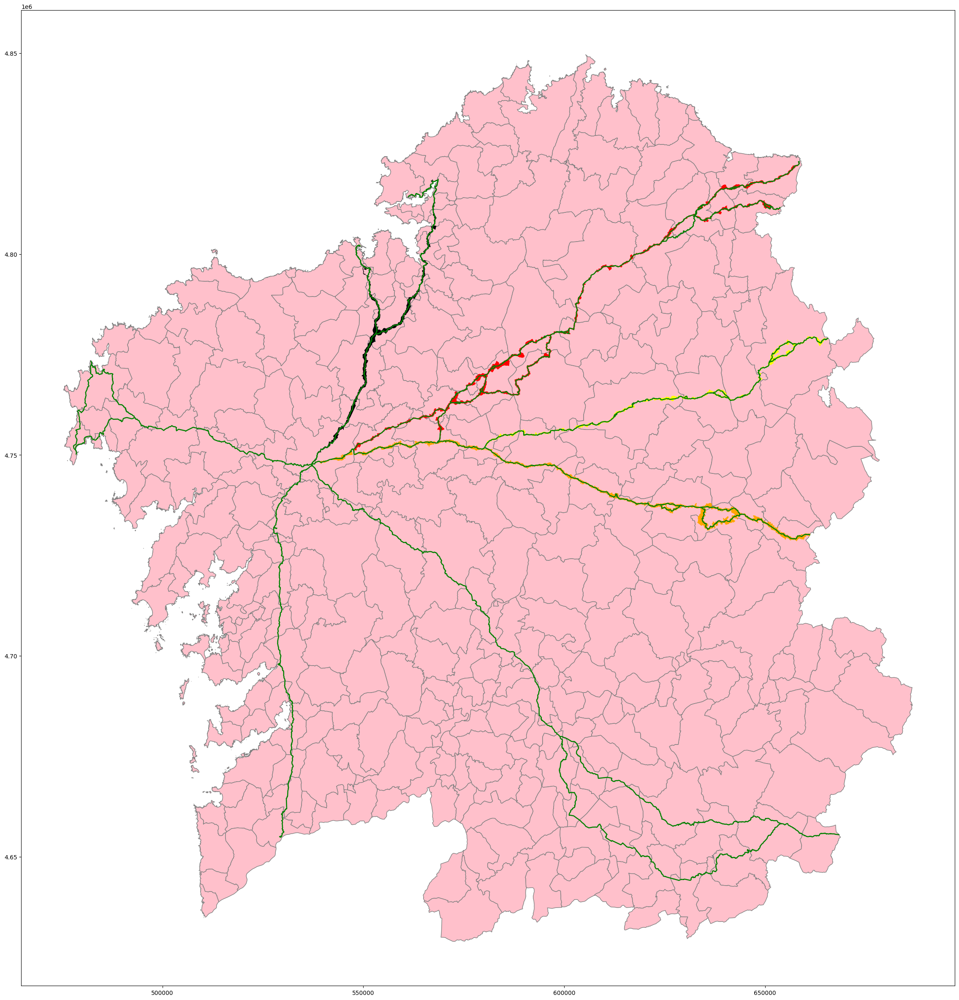

In [45]:
base = df_concello.plot(color='pink',figsize=(30,30),edgecolor='gray')

df_camiño_frances.plot(ax=base,linewidth=0.8,color=df_camiño_frances.color)
df_camiño_ingles.plot(ax=base,linewidth=0.8,color=df_camiño_ingles.color)
df_camiño_nortecosta.plot(ax=base,linewidth=0.8,color=df_camiño_nortecosta.color)
df_camiño_norteinterior.plot(ax=base,linewidth=0.8,color=df_camiño_norteinterior.color)
df_camiño_fisterra.plot(ax=base,linewidth=0.8,color=df_camiño_fisterra.color)
df_camiño_portugues.plot(ax=base,linewidth=0.8,color=df_camiño_portugues.color)
df_camiño_prata.plot(ax=base,linewidth=0.8,color=df_camiño_prata.color)
df_todos.plot(ax=base,linewidth=1.8,color=df_todos.color)


## Da páxina de turimo de Galicia obteño o listado de albergues, a súa latitude e lonxitude, ten a opción de descargar os datos para GPS e o descargalos quedan gardados nun CSV

In [50]:
albergues=pd.read_csv('/content/drive/MyDrive/camiño/camiño/galicia.csv', delimiter=',', names=['lat', 'lon', 'nome'])


albergues


,lat,lon,nome
0,-7.920739,43.066590,"""A CABANA"""
1,-9.188082,42.954480,"""A CASA DA FONTE"""
2,-8.608269,42.283157,"""A CASA DA HERBA"""
3,-7.451646,42.767853,"""A CASA DE CARMEN"""
4,-8.536836,42.861240,"""A CASA DE DORA"""
...,...,...,...
272,-7.326944,42.731110,"""VAL DE SAMOS"""
273,-7.749166,42.843918,"""VENTAS O CRUCEIRO I"""
274,-7.748805,42.843860,"""VENTAS O CRUCEIRO II"""
275,-8.164056,42.925415,"""VÍA LÁCTEA"""


In [51]:
albergues.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 277 entries, 0 to 276
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   lat     277 non-null    float64
 1   lon     277 non-null    float64
 2   nome    277 non-null    object 
dtypes: float64(2), object(1)
memory usage: 6.6+ KB


## Mostro o mapa de Galicia con folium, engado os concellos, os camiños e creo un cluster de marcas cos puntos dos albergues. Ademáis engado algúns puntos de interese

In [52]:
import pandas as pd

recomendacions = pd.DataFrame(
    { 'nome' : ['Catedral de Santiago','San Andrés de Teixido','Finisterra', 'O Cebreiro', 'Sarria','Tui'],
    'comentario' : ['O abrazo ó apostol','Outro lugar para peregrinar, vas de vivo ou de morto','Se queres podes segir un pouco máis ata a fin do mundo','Aquí o camiño entra en Galicia','Distancia mínima para obter a Compostelana','Entrando en Galicia dende Portugal']})
recomendacions

,nome,comentario
0,Catedral de Santiago,O abrazo ó apostol
1,San Andrés de Teixido,"Outro lugar para peregrinar, vas de vivo ou de..."
2,Finisterra,Se queres podes segir un pouco máis ata a fin ...
3,O Cebreiro,Aquí o camiño entra en Galicia
4,Sarria,Distancia mínima para obter a Compostelana
5,Tui,Entrando en Galicia dende Portugal


In [54]:
datos_camiño = []

search_url = 'https://nominatim.openstreetmap.org/search'
#search_url = 'http://localhost:8080/search'
#search_url = 'http://34.79.16.254/'

for idx, recomendacion in recomendacions.iterrows():
    search_payload = {'q': recomendacion.nome ,'format':'json'}
    search_response = requests.get(search_url,params=search_payload)
    latitude = search_response.json()[0]['lat']
    longitude = search_response.json()[0]['lon']
    osm_id = search_response.json()[0]['osm_id']

    datos_camiño.append([recomendacion.nome,latitude,longitude])

puntosdeinterese = pd.DataFrame(datos_camiño,columns=['nome','latitude','lonxitude'])
puntosdeinterese

,nome,latitude,lonxitude
0,Catedral de Santiago,43.2572087,-2.9237022309776886
1,San Andrés de Teixido,43.7090966,-7.9838747
2,Finisterra,48.24511525,-4.044090245241742
3,O Cebreiro,42.7174162,-7.05163047342687
4,Sarria,42.7784203,-7.4146607
5,Tui,42.0501375,-8.6466411


In [55]:
puntosdeinterese = puntosdeinterese.merge(recomendacions)
puntosdeinterese

,nome,latitude,lonxitude,comentario
0,Catedral de Santiago,43.2572087,-2.9237022309776886,O abrazo ó apostol
1,San Andrés de Teixido,43.7090966,-7.9838747,"Outro lugar para peregrinar, vas de vivo ou de..."
2,Finisterra,48.24511525,-4.044090245241742,Se queres podes segir un pouco máis ata a fin ...
3,O Cebreiro,42.7174162,-7.05163047342687,Aquí o camiño entra en Galicia
4,Sarria,42.7784203,-7.4146607,Distancia mínima para obter a Compostelana
5,Tui,42.0501375,-8.6466411,Entrando en Galicia dende Portugal


In [56]:
puntosdeinterese.to_csv('restaurantes.csv',sep=';',index=None)

In [60]:
import folium.plugins

df_albergues = albergues.astype(str)

m = folium.Map(location=[43, -8.20],zoom_start=8, width=800, height=800)

# capa tiles
#folium.TileLayer('Stamen Terrain').add_to(m)
#folium.TileLayer('CartoDB Positron').add_to(m)

# capa concello
#folium.GeoJson(df_concello, name='Concello').add_to(m)

# capa camiño francés
folium.GeoJson(df_camiño_frances).add_to(m)

# capa camiño inglés
folium.GeoJson(df_camiño_ingles).add_to(m)

# capa camiño norte costa
folium.GeoJson(df_camiño_nortecosta).add_to(m)

# capa camiño norte interior
folium.GeoJson(df_camiño_norteinterior).add_to(m)

# capa camiño portugues
folium.GeoJson(df_camiño_portugues).add_to(m)

# capa camiño fisterra
folium.GeoJson(df_camiño_fisterra).add_to(m)

# capa camiño vía da prata
folium.GeoJson(df_camiño_prata).add_to(m)

# capa de todolos camiños
folium.GeoJson(df_todos).add_to(m)



for idx, punto in puntosdeinterese.iterrows():
    folium.Marker([punto.latitude,punto.lonxitude],
    tooltip=punto.nome,
    popup=(f'{punto.nome} ({punto.comentario})'),
    icon=folium.Icon(color='pink',icon='flag', prefix='fa')). \
    add_to(m)

sw = puntosdeinterese[['latitude', 'lonxitude']].min().values.tolist()
ne = puntosdeinterese[['latitude', 'lonxitude']].max().values.tolist()

# clúster
marker_cluster = folium.plugins.MarkerCluster().add_to(m)

# capa albergues
for index, albergue in albergues.iterrows():

        latitude = albergue['lon']
        lonxitude = albergue['lat']
        nome = albergue['nome']
        folium.Marker([latitude,lonxitude],popup=nome,icon=folium.Icon(color='red',icon='hotel', prefix='fa')).add_to(marker_cluster)

m.fit_bounds([sw, ne])

folium.LayerControl().add_to(m)
m